<a href="https://colab.research.google.com/github/Harsha1569/DSP_Lab/blob/main/Experiment_2/Experiment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


Note: Roll Number = 191EE123 <br>
a = 1 + mod(123,4) = 4

In [ ]:
import numpy as np
import IPython
import scipy
import math
import pandas as pd
import io
from IPython.display import Audio, display
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import style
from matplotlib import rcParams
from scipy import signal as sp
from scipy.io import wavfile
from scipy.fftpack import fft



a = 4
pi = np.pi


%matplotlib inline
plt.style.use(['seaborn-notebook'])
plt.rcParams.update({
    "font.serif": ["cm"],
    "mathtext.fontset": "cm",
    "figure.figsize": (15, 8),
    "axes.labelsize": 15,
    "font.size": 8})

# **Problem** **1**. <br>
Part 1:

In [ ]:
f1 = 5*a
f2 = 6*a
f3 = 10*a
t = np.linspace(0,1/a,5000)
y1 = a*np.cos(2*pi*f1*t)
y2 = (a/2)*np.cos(2*pi*f2*t)
y3 = (a/4)*np.cos(2*pi*f3*t)
plot_label = ['$4*cos(40*\pi*t)$', '$2*cos(48*\pi*t)$', '$1*cos(80*\pi*t)$']
plot_title = ['Cosine function with amplitude ' + r'$\alpha$' + ' and frequency 5'+r'$\alpha$'+ ' Hz', 'Cosine function with amplitude ' + r'$\alpha /2$' + ' and frequency 6'+r'$\alpha$'+ ' Hz', 'Cosine function with amplitude ' + r'$\alpha /4$' + ' and frequency 10'+r'$\alpha$'+ ' Hz']

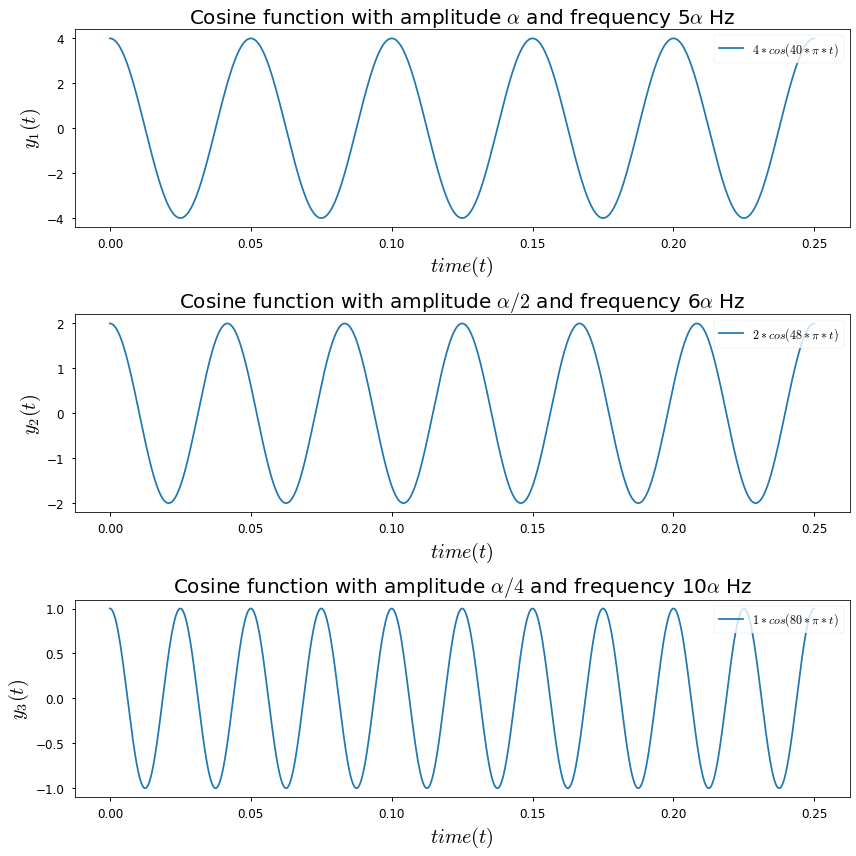

In [ ]:
fig, axs = plt.subplots(3, figsize=(12,12))
def plot_signal(x, y, xaxis_label=None, yaxis_label=None, row=None):  
    axs[row].plot(x, y, label = plot_label[row])
    axs[row].legend(loc = 'upper right', fontsize = 12)
    axs[row].set_title(plot_title[row], fontsize = 20)
    axs[row].set_xlabel(xaxis_label, fontsize = 20)
    axs[row].set_ylabel(yaxis_label, fontsize = 20)
    axs[row].tick_params(axis="both", labelsize = 12)
    fig.tight_layout()
    
plot_signal(t, y1, xaxis_label=r'$time(t)$', yaxis_label=r'$y_1(t)$', row=0)
plot_signal(t, y2, xaxis_label=r'$time(t)$', yaxis_label=r'$y_2(t)$', row=1)
plot_signal(t, y3, xaxis_label=r'$time(t)$', yaxis_label=r'$y_3(t)$', row=2)
fig.savefig('fig1.png')

Part 2:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  if __name__ == '__main__':


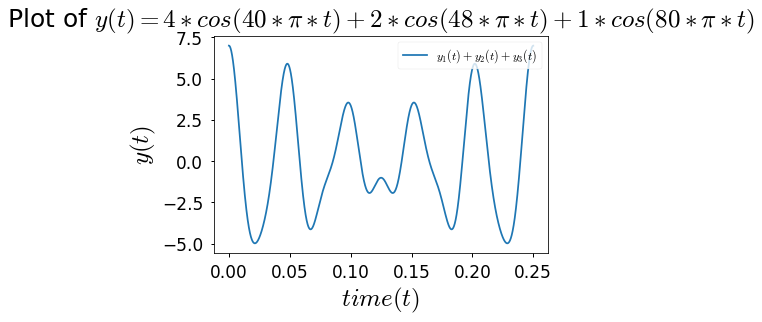

In [ ]:
y = y1 + y2 + y3
fig, axs = plt.subplots()
axs.plot(t, y, label=r'$y_1(t)+y_2(t)+y_3(t)$')
axs.legend(loc = 'upper right', fontsize = 12)
axs.set_ylabel(r'$y(t)$', fontsize = 25)
axs.set_xlabel(r'$time(t)$', fontsize = 25)
axs.tick_params(axis="both", labelsize = 17)
axs.set_title('Plot of $y(t) = 4*cos(40*\pi*t) + 2*cos(48*\pi*t)+ 1*cos(80*\pi*t)$', fontsize = 25)
fig.tight_layout()
fig.savefig('fig2.png')

Part 3: <br>
a) Given sampling rate $F_s$ = 14$\alpha$ $\frac{samples}{sec}$= 56$\frac{samples}{sec}$ <br>
b) NyquistRate ($F_s$) = twice the max frequency = 2*10$\alpha$ = 80$\frac{samples}{sec}$ <br>
c) Since, the 6$\alpha$ frequecy is alliased to 3$\alpha$, we can say that the folding frequency ($\frac{F_s}{2}$) = $\frac{6\alpha + 3\alpha}{2}$ = 4.5$\alpha$ Hz <br>
This implies that the sampling frequency $F_s$ = $2*4.5\alpha$ = 9$\alpha$$\frac{samples}{sec}$ 


In [ ]:
def cummulative_signal(t):
  return a*np.cos(2*pi*5*a*t) + (a/2)*np.cos(2*pi*6*a*t) + (a/4)*np.cos(2*pi*10*a*t)

sampling_freq_1 = 14*a
sampling_freq_2 = 20*a
sampling_freq_3 = 9*a

n1=np.arange(0, (1/a)+(1/sampling_freq_1), (1/sampling_freq_1))
n2=np.arange(0, (1/a)+(1/sampling_freq_2), (1/sampling_freq_2))
n3=np.arange(0, (1/a)+(1/sampling_freq_3), (1/sampling_freq_3))
stem_plot_title = ['Stem plot of cummulative signal when $F_s$ = 14' + r'$\alpha\ \frac{samples}{sec}$','Stem plot of cummulative signal when $F_s$ = 20' + r'$\alpha\ \frac{samples}{sec}$','Stem plot of cummulative signal when $F_s$ = 9' + r'$\alpha\ \frac{samples}{sec}$']

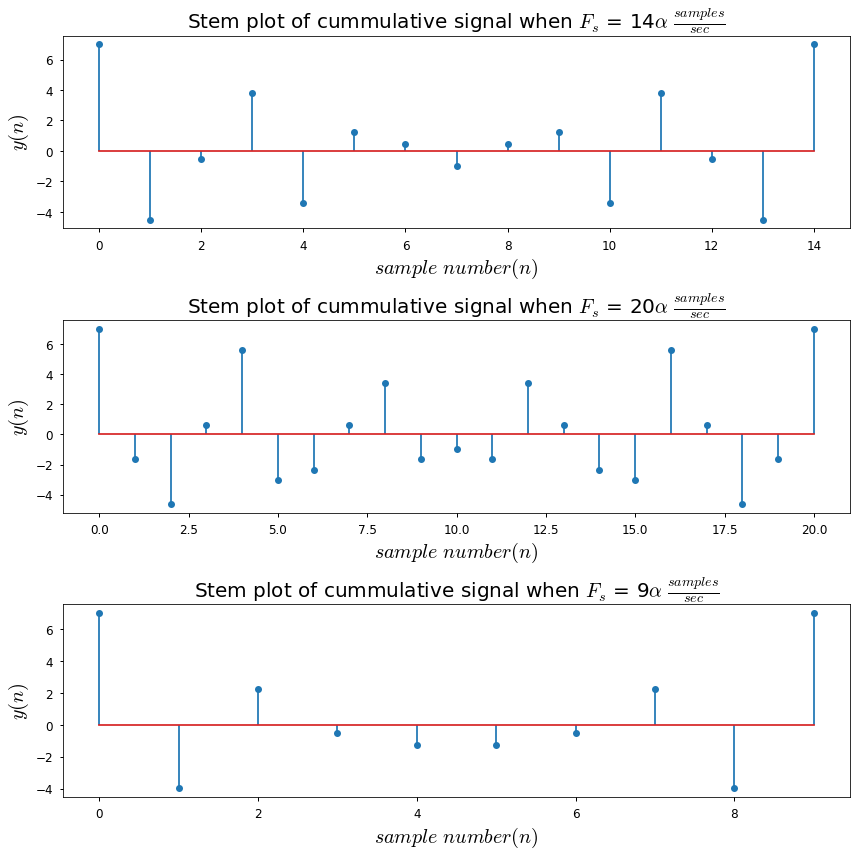

In [ ]:
fig, axs = plt.subplots(3, figsize=(12,12))
def plot_signal(x, y, xaxis_label=None, yaxis_label=None, row=None):  
    axs[row].stem(x, y, use_line_collection = True)
    axs[row].set_title(stem_plot_title[row], fontsize = 20)
    axs[row].set_xlabel(xaxis_label, fontsize = 20)
    axs[row].set_ylabel(yaxis_label, fontsize = 20)
    axs[row].tick_params(axis="both", labelsize = 12)
    fig.tight_layout()
    
plot_signal(n1*sampling_freq_1, cummulative_signal(n1), xaxis_label=r'$sample\ number(n)$', yaxis_label=r'$y(n)$', row=0)
plot_signal(n2*sampling_freq_2, cummulative_signal(n2), xaxis_label=r'$sample\ number(n)$', yaxis_label=r'$y(n)$', row=1)
plot_signal(n3[0:10]*sampling_freq_3, cummulative_signal(n3)[0:10], xaxis_label=r'$sample\ number(n)$', yaxis_label=r'$y(n)$', row=2)
fig.savefig('fig3.png')

Part 4:


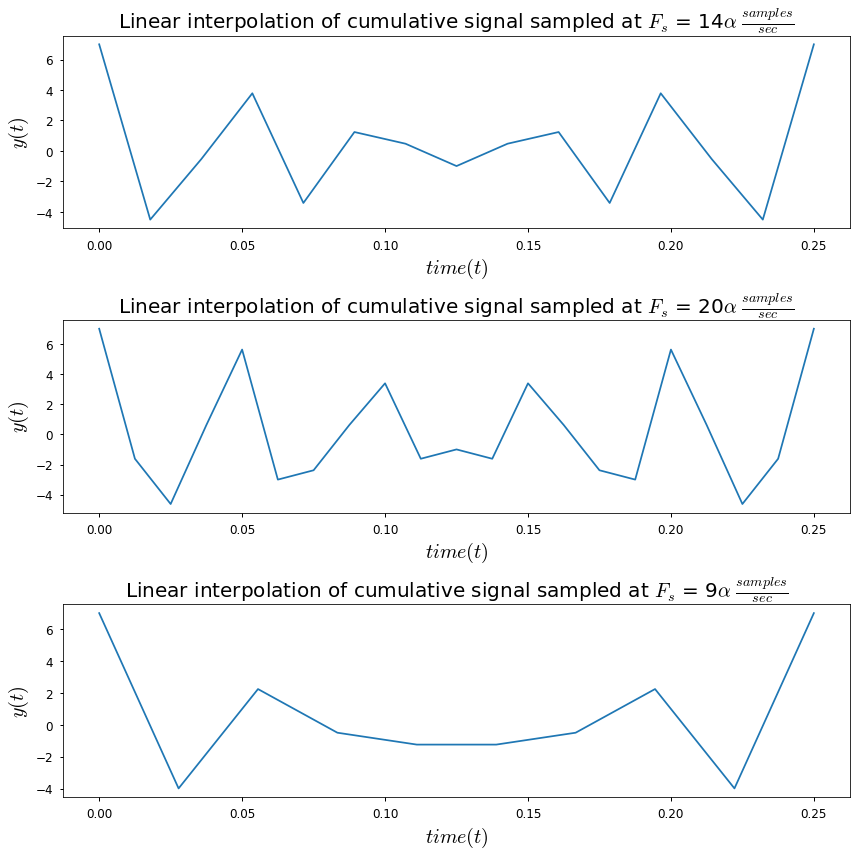

In [ ]:
title = ['Linear interpolation of cumulative signal sampled at $F_s$ = 14' + r'$\alpha\ \frac{samples}{sec}$','Linear interpolation of cumulative signal sampled at $F_s$ = 20' + r'$\alpha\ \frac{samples}{sec}$','Linear interpolation of cumulative signal sampled at $F_s$ = 9' + r'$\alpha\ \frac{samples}{sec}$']
fig, axs = plt.subplots(3, figsize=(12,12))
def plot_signal(x, y, xaxis_label=None, yaxis_label=None, row=None):  
    axs[row].plot(x, y)
    axs[row].set_title(title[row], fontsize = 20)
    axs[row].set_xlabel(xaxis_label, fontsize = 20)
    axs[row].set_ylabel(yaxis_label, fontsize = 20)
    axs[row].tick_params(axis="both", labelsize = 12)
    fig.tight_layout()
    
plot_signal(n1, cummulative_signal(n1), xaxis_label=r'$time(t)$', yaxis_label=r'$y(t)$', row=0)
plot_signal(n2, cummulative_signal(n2), xaxis_label=r'$time(t)$', yaxis_label=r'$y(t)$', row=1)
plot_signal(n3[0:10], cummulative_signal(n3)[0:10], xaxis_label=r'$time(t)$', yaxis_label=r'$y(t)$', row=2)
fig.savefig('fig4.png')

We know that the maximum frequency of the cumulative signal is 10$\alpha$. We also know that the Nyquist Rate is 20$\alpha$ meaning that if the sampling frequency $F_s$ is greater than the Nyquist Rate, then as per sampling theorem we can retrieve the signal completely. <br>


1.  Here, the cumulative signal is first sampled at a rate higher than the max. 
frequency of the signal but less than than the Nyquist rate <br>(10$\alpha$ < 14$\alpha$ < 20$\alpha$). Thus we notice a reasonable but not satisfactory linear interpolation since only some of the peaks & dips seen in the original signal have been omitted i.e., the signal is undersampled. Thus it is not advisable to interpret the behaviour of the original cumulative signal from this sampled signal.
2.   Now the cumulative signal is sampled at a rate equal to the Nyquist Rate, due to which we can notice a decent linear interpolation of the original signal i.e., it has captured all the peaks & dips seen in the original signal. Thus, we can get a rough sense about the behaviour of the original cumulative signal.
3. Lastly, the cumulative signal is sampled at a rate less than the max. frequency of the signal & the Nyquist Rate (9$\alpha$ < 10$\alpha$ < 20$\alpha$). Here we notice that the resultant signal from the linear interpolation does not depict most of the peaks & dips seen in the original signal as it is severely undersampled. Thus it is not advisable to interpret the behaviour of the original cumulative signal from this sampled signal.

Part 5:

In [ ]:
def cummulative_signal(t):
  return a*np.cos(2*pi*5*a*t) + (a/2)*np.cos(2*pi*6*a*t) + (a/4)*np.cos(2*pi*10*a*t)

sampling_rate_1 = 14*a
sampling_rate_2 = 20*a
sampling_rate_3 = 9*a

n1=np.arange(0, (1/a), (1/sampling_rate_1))
n2=np.arange(0, (1/a), (1/sampling_rate_2))
n3=np.arange(0, (1/a), (1/sampling_rate_3))
0
def ed_spectrum(x, Fs, do_fft=True):
    C = int((len(x)+a) / 2) 
    X = np.abs(np.fft.fft(x)) if do_fft else x[0:C]
    N = Fs * np.arange(0, C) / len(x);
    E = (X**2)[0:C]
    return N, E
    
frequency_1, energy_spectrum_1 = ed_spectrum(cummulative_signal(n1), sampling_rate_1)
frequency_2, energy_spectrum_2 = ed_spectrum(cummulative_signal(n2), sampling_rate_2)
frequency_3, energy_spectrum_3 = ed_spectrum(cummulative_signal(n3), sampling_rate_3)

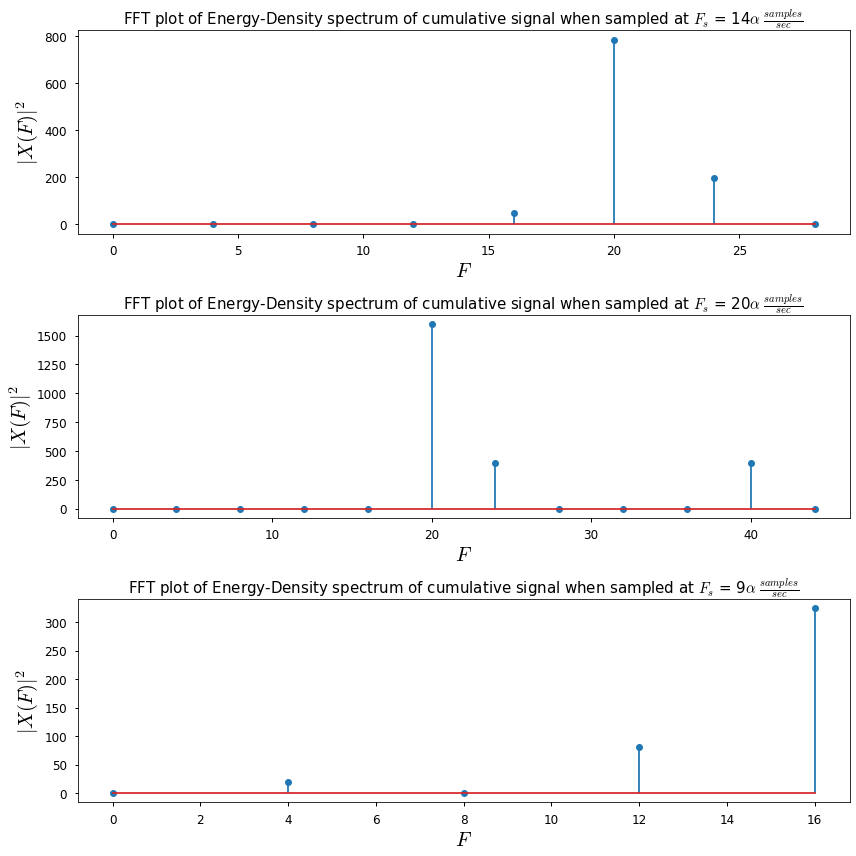

In [ ]:
title_e = ['FFT plot of Energy-Density spectrum of cumulative signal when sampled at $F_s$ = 14' + r'$\alpha\ \frac{samples}{sec}$','FFT plot of Energy-Density spectrum of cumulative signal when sampled at $F_s$ = 20' + r'$\alpha\ \frac{samples}{sec}$','FFT plot of Energy-Density spectrum of cumulative signal when sampled at $F_s$ = 9' + r'$\alpha\ \frac{samples}{sec}$']
fig, axs = plt.subplots(3, figsize=(12,12))
def plot_signal(x, y, xaxis_label=None, yaxis_label=None, row=None):  
    if (row == 0):
      axs[row].stem(x[0:8], y[0:8], use_line_collection = True)
    elif (row == 1):
      axs[row].stem(x, y, use_line_collection = True)
    else:
      axs[row].stem(x[0:5], y[0:5], use_line_collection = True)

    axs[row].set_title(title_e[row], fontsize = 15)
    axs[row].set_xlabel(xaxis_label, fontsize = 20)
    axs[row].set_ylabel(yaxis_label, fontsize = 20)
    axs[row].tick_params(axis="both", labelsize = 12)
    fig.tight_layout()
    
plot_signal(frequency_1, energy_spectrum_1, xaxis_label=r'$F$', yaxis_label=r'$|X(F)|^2$', row=0)
plot_signal(frequency_2, energy_spectrum_2, xaxis_label=r'$F$', yaxis_label=r'$|X(F)|^2$', row=1)
plot_signal(frequency_3, energy_spectrum_3, xaxis_label=r'$F$', yaxis_label=r'$|X(F)|^2$', row=2)
fig.savefig('fig5.png')

Upon plotting the energy density spectrum for the cumulative signal sampled at the 3 different frequencies mentioned above, we observe that:<br>
The frequencies of the cumulative signal under consideration are 5$\alpha$=20Hz, 6$\alpha$=24Hz & 10$\alpha$=40Hz.


1.   (Fs = 14$\alpha$$\frac{samples}{sec} = 56Hz$): Here, we notice 3 peaks at 16Hz, 20Hz & 24Hz. The folding frequency is $\frac{F_s}{2} = 7\alpha$, meaning that the 10$\alpha = 40Hz$ frequency gets folded to a lower frequency of 4$\alpha = 16Hz$, while the other 2 frequencies of 20Hz & 24Hz appear as is without any folding.
2.   (Fs = 20$\alpha$$\frac{samples}{sec} = 80Hz$): Here, we notice 3 peaks at 20Hz, 24Hz & 40Hz. The folding frequency is $\frac{F_s}{2} = 10\alpha$, meaning that that,all the frequency components of the cumulative signal appear as it without any folding.
3. (Fs = 9$\alpha$$\frac{samples}{sec} = 36Hz$): Here, we notice 3 peaks at 4Hz, 12Hz & 16Hz. The folding frequency is $\frac{F_s}{2} = 4.5\alpha$, meaning that 5$\alpha = 20Hz$ frequency gets folded to a lower frequency of 4$\alpha = 16Hz$, 6$\alpha = 24Hz$ frequency to 3$\alpha = 12Hz$ & 10$\alpha = 40Hz$ frequency to 1$\alpha = 4Hz$. <br>
In addition, we can notice that these peaks appear with heights in proportion to the amplitudes assigned to each frequency signal initially.





# **Problem** **2**. <br>

Here, we can notice that the maximum frequency of a note is 523.25 Hz. This means that the tone generated from appending the given list of notes has a Nyquist Rate = twice the max. note frequency = 1046.5 Hz. This implies that when the resultant signal is sampled at a frequency higher than its Nyquist Rate, we can clearly distinguish between each of the 8 different frequency notes.

In [ ]:
frequencies = np.array([261.63, 293.66, 329.63, 349.23, 392.00, 440.00, 493.88, 523.25]) 
#array elements correspond to each note in "Do Re Mi Fa So La Ti Do" respectively

Fs1 = 16000
Fs2 = 1500
Fs3 = 1000
Fs4 = 700

def signal_write(f, filename = None):
  tone_sound = []
  for itr in range(len(frequencies)):
    t = np.arange((itr-1), itr, 1/f)
    tone_sound = np.hstack([tone_sound, np.sin(frequencies[itr]*2*np.pi*t)])
  display(Audio(data=tone_sound, rate=f))
  wavfile.write(filename, f, tone_sound.astype(np.float32))

signal_write(Fs1, filename = 'Q2_sample_signal_1.wav')
signal_write(Fs2, filename = 'Q2_sample_signal_2.wav')
signal_write(Fs3, filename = 'Q2_sample_signal_3.wav')
signal_write(Fs4, filename = 'Q2_sample_signal_4.wav')

Here, the resultant signal (tone) is sampled at 4 differnt sampling rates. On listening to the audio files generated in each case, we can observe that:


1.   (Fs = 16000 $\frac{samples}{sec}$): When sampled at a frequency much higher than the Nyqiust Rate, we can clearly notice that the resultant signal comprises of 8 different notes of increasing frequencies.
2.   (Fs = 1500 $\frac{samples}{sec}$): Even when the resultant signal is sampled at a frequency slightly higher than its Nyquist rate, we can still clearly distinguish between the 8 different notes as in the previous case.
3. (Fs = 1000 $\frac{samples}{sec}$): Now upon sampling the resultant tone at a rate just lower than its Nyquist Rate, we notice that the last note gets folded to a new frequency of a lower value, and we can no longer hear the original tone that consisted of 8 different notes of increasing frequencies.
4. (Fs = 700 $\frac{samples}{sec}$): In this case, when the sampling rate is much lower than the Nyquist Rate of the resultant signal, we notice that the frequency of the tone increases for the first 4 notes and then decreases since the higher frequency notes are getting folded to lower ones.



# **Problem** **3**. <br>

In [ ]:
Fs, track= wavfile.read('Track004.wav')
track = track/32767.0
print('Sampling rate: {}Hz'.format(Fs))
display(Audio(data=track, rate=Fs))
print('Size of track signal: {}'.format(track.shape))

Sampling rate: 44100Hz


Size of track signal: (485100,)


In [ ]:
#Downsampling by an integer factor
#(sampling rate = Fs/2)
secs = len(track)//Fs # Number of seconds in signal track
Fs1 = Fs//2           # New sampling rate
samps1 = secs*(Fs1)    # Number of samples to downsample
track1 = sp.resample(track, samps1)
print('Sampling rate: {}Hz'.format(Fs1))
display(Audio(data=track1, rate=Fs1))
wavfile.write('Q3_downsampled_signal_1.wav', Fs1, (track1*32767.0).astype(np.int16))
print('Size of track signal: {}'.format(track1.shape))

Sampling rate: 22050Hz


Size of track signal: (242550,)


In [ ]:
#Downsampling by an integer factor
#(sampling rate = Fs/10)
secs = len(track)//Fs # Number of seconds in signal track
Fs2 = Fs//10           # New sampling rate
samps2 = secs*(Fs2)    # Number of samples to downsample
track2 = sp.resample(track, samps2)
print('Sampling rate: {}Hz'.format(Fs2))
display(Audio(data=track2, rate=Fs2))
wavfile.write('Q3_downsampled_signal_2.wav', Fs2, (track2*32767.0).astype(np.int16))
print('Size of track signal: {}'.format(track2.shape))

Sampling rate: 4410Hz


Size of track signal: (48510,)


In [ ]:
#Downsampling by an integer factor
#(sampling rate = Fs/25)
secs = len(track)//Fs # Number of seconds in signal track
Fs3 = Fs//25           # New sampling rate
samps3 = secs*(Fs3)    # Number of samples to downsample
track3 = sp.resample(track, samps3)
print('Sampling rate: {}Hz'.format(Fs3))
display(Audio(data=track3, rate=Fs3))
wavfile.write('Q3_downsampled_signal_3.wav', Fs3, (track3*32767.0).astype(np.int16))
print('Size of track signal: {}'.format(track3.shape))

Sampling rate: 1764Hz


Size of track signal: (19404,)


In [ ]:
#Upsampling by an integer factor
#(sampling rate = Fs*6)
secs = len(track)//Fs # Number of seconds in signal track
Fs4 = Fs*6          # New sampling rate
samps4 = secs*(Fs4)    # Number of samples to downsample
track4 = sp.resample(track, samps4)
print('Sampling rate: {}Hz'.format(Fs4))
display(Audio(data=track4, rate=Fs4))
wavfile.write('Q3_upsampled_signal_1.wav', Fs4, (track4*32767.0).astype(np.int16))
print('Size of track signal: {}'.format(track4.shape))

Sampling rate: 264600Hz


Size of track signal: (2910600,)


In [ ]:
#Downsampling by an non-integer factor
#(sampling rate = 3*Fs/20)
secs = len(track)//Fs # Number of seconds in signal track
Fs5 = 3*Fs//20           # New sampling rate
samps5 = secs*(Fs5)    # Number of samples to downsample
track5 = sp.resample(track, samps5)
print('Sampling rate: {}Hz'.format(Fs5))
display(Audio(data=track5, rate=Fs5))
wavfile.write('Q3_downsampled_signal_4.wav', Fs5, (track5*32767.0).astype(np.int16))
print('Size of track signal: {}'.format(track5.shape))

Sampling rate: 6615Hz


Size of track signal: (72765,)
